# Лабораторная работа № 7. Введение в работу с данными

In [1]:
# Обновление окружения:
using Pkg
Pkg.update

# Установка пакетов:
using Pkg
for p in ["CSV", "DataFrames", "RDatasets", "FileIO"]
    Pkg.add(p)
end
using CSV, DataFrames, DelimitedFiles

    Updating registry at `C:\Users\Home\.julia\registries\General.toml`
   Resolving package versions...
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
Precompiling project...
  18359.9 ms  ✓ DispatchDoctor → DispatchDoctorEnzymeCoreExt
  16465.7 ms  ✓ RecursiveArrayTools → RecursiveArrayToolsTablesExt
  16507.4 ms  ✓ PDMats → StatsBaseExt
  16490.0 ms  ✓ MatrixFactorizations
  16856.8 ms  ✓ BlockArrays
   5000.7 ms  ✓ SCCNonlinearSolve
   5206.0 ms  ✓ SciMLBase → SciMLBaseMLStyleExt
   7106.7 ms  ✓ FiniteDiff → FiniteDiffBandedMatricesExt
   7121.3 ms  ✓ ArrayInterface → ArrayInterfaceBandedMatricesExt
   5005.4 ms  ✓ Unitful → ForwardDiffExt
  14235.8 ms  ✓ NonlinearSolveBase → NonlinearSolveBaseBandedMatricesExt
  13696.7 ms  ✓ SciMLBase → SciMLBasePyCallExt
  14844.3 ms  ✓ PlotlyBase → IJuliaExt
   8948.6 ms  ✓ NLsolve
   9145.9 ms  ✓ DiffEqBase → DiffEqBaseUnitfulExt
  22697.7 ms  ✓ Lin

  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
   Resolving package versions...
   Installed Mocking ─────────── v0.8.1
   Installed TZJData ─────────── v1.5.0+2025b
   Installed RData ───────────── v0.8.3
   Installed CategoricalArrays ─ v0.10.8
   Installed TimeZones ───────── v1.22.2
   Installed RDatasets ───────── v0.7.7
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [ce6b1742] + RDatasets v0.7.7
    Updating `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
⌅ [324d7699] + CategoricalArrays v0.10.8
  [78c3b35d] + Mocking v0.8.1
⌅ [df47a6cb] + RData v0.8.3
  [ce6b1742] + RDatasets v0.7.7
  [dc5dba14] + TZJData v1.5.0+2025b
  [f269a46b] + TimeZones v1.22.2
        Info Packages marked with ⌅ have new versions available but compatibility constraints restrict them from upgrading. To see why use `status --outdated -m`
Precompiling project...
   2840.7 ms  ✓ TZJDa

## Считывание данных

In [2]:
P = CSV.File("programminglanguages.csv") |> DataFrame

Row,year,language
,Int64,String31
1,1951,Regional Assembly Language
2,1952,Autocode
3,1954,IPL
4,1955,FLOW-MATIC
5,1957,FORTRAN
6,1957,COMTRAN
7,1958,LISP
8,1958,ALGOL 58
9,1959,FACT


In [3]:
# Функция определения по названию языка программирования года его создания:
function language_created_year(P,language::String)
    loc = findfirst(P[:,2].==language)
    return P[loc,1]
end

language_created_year (generic function with 1 method)

In [4]:
# Пример вызова функции и определение даты создания языка Python:
language_created_year(P,"Python")

1991

In [5]:
# Пример вызова функции и определение даты создания языка Julia:
language_created_year(P,"Julia")

2012

In [6]:
language_created_year(P,"julia")

LoadError: MethodError: no method matching getindex(::DataFrame, ::Nothing, ::Int64)
The function `getindex` exists, but no method is defined for this combination of argument types.

[0mClosest candidates are:
[0m  getindex(::DataFrame, [91m::Colon[39m, ::Union{AbstractString, Signed, Symbol, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Home\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:542[24m[39m
[0m  getindex(::DataFrame, [91m::typeof(!)[39m, ::Union{Signed, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Home\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:548[24m[39m
[0m  getindex(::DataFrame, [91m::InvertedIndex[39m, ::Union{AbstractString, Signed, Symbol, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Home\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:538[24m[39m
[0m  ...


In [7]:
# Функция определения по названию языка программирования года его создания (без учёта регистра):
function language_created_year_v2(P,language::String)
    loc = findfirst(lowercase.(P[:,2]).==lowercase.(language))
    return P[loc,1]
end

language_created_year_v2 (generic function with 1 method)

In [8]:
# Пример вызова функции и определение даты создания языка julia:
language_created_year_v2(P,"julia")

2012

In [9]:
# Построчное считывание данных с указанием разделителя:
Tx = readdlm("programminglanguages.csv", ',')

74×2 Matrix{Any}:
     "year"  "language"
 1951        "Regional Assembly Language"
 1952        "Autocode"
 1954        "IPL"
 1955        "FLOW-MATIC"
 1957        "FORTRAN"
 1957        "COMTRAN"
 1958        "LISP"
 1958        "ALGOL 58"
 1959        "FACT"
 1959        "COBOL"
 1959        "RPG"
 1962        "APL"
    ⋮        
 2003        "Scala"
 2005        "F#"
 2006        "PowerShell"
 2007        "Clojure"
 2009        "Go"
 2010        "Rust"
 2011        "Dart"
 2011        "Kotlin"
 2011        "Red"
 2011        "Elixir"
 2012        "Julia"
 2014        "Swift"

## Запись данных в файл

In [10]:
# Запись данных в CSV-файл:
CSV.write("programming_languages_data2.csv", P)

"programming_languages_data2.csv"

In [11]:
# Пример записи данных в текстовый файл с разделителем ',':
writedlm("programming_languages_data.txt", Tx, ',')

In [12]:
# Пример записи данных в текстовый файл с разделителем '-':
writedlm("programming_languages_data2.txt", Tx, '-')

In [13]:
# Построчное считывание данных с указанием разделителя:
P_new_delim = readdlm("programming_languages_data2.txt", '-')

74×2 Matrix{Any}:
     "year"  "language"
 1951        "Regional Assembly Language"
 1952        "Autocode"
 1954        "IPL"
 1955        "FLOW-MATIC"
 1957        "FORTRAN"
 1957        "COMTRAN"
 1958        "LISP"
 1958        "ALGOL 58"
 1959        "FACT"
 1959        "COBOL"
 1959        "RPG"
 1962        "APL"
    ⋮        
 2003        "Scala"
 2005        "F#"
 2006        "PowerShell"
 2007        "Clojure"
 2009        "Go"
 2010        "Rust"
 2011        "Dart"
 2011        "Kotlin"
 2011        "Red"
 2011        "Elixir"
 2012        "Julia"
 2014        "Swift"

## Словари

In [14]:
# Инициализация словаря:
dict = Dict{Integer,Vector{String}}()

Dict{Integer, Vector{String}}()

In [15]:
# Заполнение словаря данными:
for i = 1:size(P,1)
    year,lang = P[i,:]
    if year in keys(dict)
        dict[year] = push!(dict[year],lang)
    else
        dict[year] = [lang]
    end
end

In [18]:
dict[2003]

2-element Vector{String}:
 "Groovy"
 "Scala"

## DataFrames

In [19]:
df = DataFrame(year = P[:,1], language = P[:,2])

Row,year,language
,Int64,String31
1,1951,Regional Assembly Language
2,1952,Autocode
3,1954,IPL
4,1955,FLOW-MATIC
5,1957,FORTRAN
6,1957,COMTRAN
7,1958,LISP
8,1958,ALGOL 58
9,1959,FACT


In [20]:
# Вывод всех значения столбца year:
df[!,:year]

73-element Vector{Int64}:
 1951
 1952
 1954
 1955
 1957
 1957
 1958
 1958
 1959
 1959
 1959
 1962
 1962
    ⋮
 2003
 2005
 2006
 2007
 2009
 2010
 2011
 2011
 2011
 2011
 2012
 2014

In [23]:
# Получение статистических сведений о фрейме:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,year,1982.99,1951,1986.0,2014,0,Int64
2,language,,ALGOL 58,,dBase III,0,String31


In [24]:
# Подгружаем пакет RDatasets:
using RDatasets

In [25]:
# Задаём структуру данных в виде набора данных:
iris = dataset("datasets", "iris")

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


In [26]:
# Определения типа переменной:
typeof(iris)

DataFrame

In [27]:
describe(iris)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,SepalLength,5.84333,4.3,5.8,7.9,0,Float64
2,SepalWidth,3.05733,2.0,3.0,4.4,0,Float64
3,PetalLength,3.758,1.0,4.35,6.9,0,Float64
4,PetalWidth,1.19933,0.1,1.3,2.5,0,Float64
5,Species,,setosa,,virginica,0,"CategoricalValue{String, UInt8}"


## Работа с переменными отсутствующеготипа (Missing Values)

In [28]:
# Отсутствующий тип:
a = missing
typeof(a)

Missing

In [31]:
# Пример операции с переменной отсутствующего типа:
a + 1

missing

In [33]:
# Определение перечня продуктов:
foods = ["apple", "cucumber", "tomato", "banana"]
# Определение калорий:
calories = [missing, 47, 22, 105]

4-element Vector{Union{Missing, Int64}}:
    missing
  47
  22
 105

In [34]:
# Определение типа переменной:
typeof(calories)

Vector{Union{Missing, Int64}} (alias for Array{Union{Missing, Int64}, 1})

In [35]:
# Подключаем пакет Statistics:
using Statistics

In [36]:
# Определение среднего значения:
mean(calories)

missing

In [37]:
# Определение среднего значения без значений с отсутствующим типом:
mean(skipmissing(calories))

58.0

In [40]:
# Задание сведений о ценах:
prices = [0.85, 1.6, 0.8, 0.6]

# Формирование данных о калориях:
dataframe_calories = DataFrame(item=foods,calories=calories)

# Формирование данных о ценах:
dataframe_prices = DataFrame(item=foods,price=prices)

# Объединение данных о калориях и ценах:
DF = innerjoin(dataframe_calories,dataframe_prices,on=:item)

Row,item,calories,price
,String,Int64?,Float64
1,apple,missing,0.85
2,cucumber,47,1.6
3,tomato,22,0.8
4,banana,105,0.6


##  FileIO

In [41]:
# Подключаем пакет FileIO:
using FileIO

In [42]:
# Подключаем пакет ImageIO:
import Pkg
Pkg.add("ImageIO")

   Resolving package versions...
   Installed OpenEXR ──────── v0.3.3
   Installed ImageIO ──────── v0.6.9
   Installed ProgressMeter ── v1.11.0
   Installed Sixel ────────── v0.1.5
   Installed JpegTurbo ────── v0.1.6
   Installed PNGFiles ─────── v0.4.4
   Installed AxisArrays ───── v0.4.8
   Installed TiffImages ───── v0.11.6
   Installed Netpbm ───────── v1.1.1
   Installed SIMD ─────────── v3.7.2
   Installed QOI ──────────── v1.0.2
   Installed Imath_jll ────── v3.1.11+0
   Installed PkgVersion ───── v0.3.3
   Installed ImageMetadata ── v0.9.10
   Installed WebP ─────────── v0.1.3
   Installed LazyModules ──── v0.3.1
   Installed RangeArrays ──── v0.3.2
   Installed OpenEXR_jll ──── v3.2.4+0
   Installed libsixel_jll ─── v1.10.5+0
   Installed IndirectArrays ─ v1.0.0
   Installed ImageBase ────── v0.1.7
   Installed ImageAxes ────── v0.6.12
   Installed IterTools ────── v1.10.0
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [82e4d734] + ImageIO v0.6.9
    U

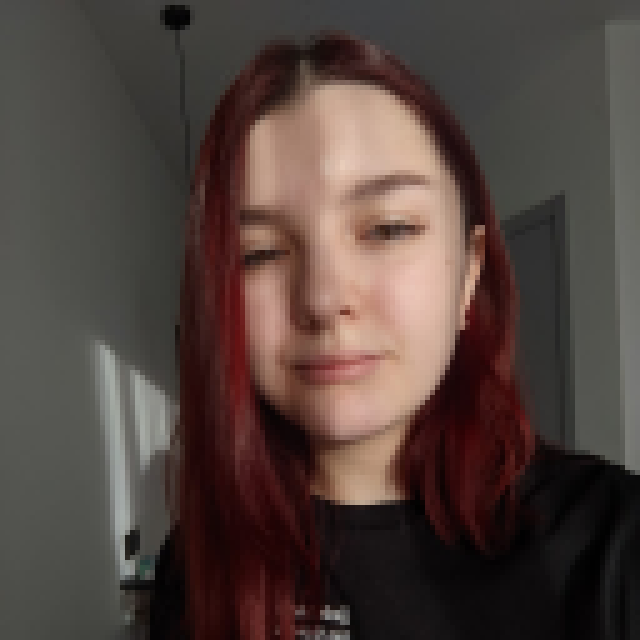

┌ Warning: Output swatches are reduced due to the large size (640×640).
│ Load the ImageShow package for large images.
└ @ Colors C:\Users\Home\.julia\packages\Colors\VFEJ1\src\display.jl:159


In [45]:
# Загрузка изображения:
X1 = load("me.jpg")

In [46]:
# Определение типа и размера данных:
@show typeof(X1);
@show size(X1);

typeof(X1) = Matrix{ColorTypes.RGB{FixedPointNumbers.N0f8}}
size(X1) = (640, 640)


## Обработка данных: стандартные алгоритмы машинного обучения в Julia

In [47]:
# Загрузка пакетов:
import Pkg
Pkg.add("Plots")
using Plots

   Resolving package versions...
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`


In [48]:
# Загрузка данных:
houses = CSV.File("houses.csv") |> DataFrame

Row,street,city,zip,state,beds,baths,sq__ft,type,sale_date,price,latitude,longitude
,String,String15,Int64,String3,Int64,Int64,Int64,String15,String31,Int64,Float64,Float64
1,3526 HIGH ST,SACRAMENTO,95838,CA,2,1,836,Residential,Wed May 21 00:00:00 EDT 2008,59222,38.6319,-121.435
2,51 OMAHA CT,SACRAMENTO,95823,CA,3,1,1167,Residential,Wed May 21 00:00:00 EDT 2008,68212,38.4789,-121.431
3,2796 BRANCH ST,SACRAMENTO,95815,CA,2,1,796,Residential,Wed May 21 00:00:00 EDT 2008,68880,38.6183,-121.444
4,2805 JANETTE WAY,SACRAMENTO,95815,CA,2,1,852,Residential,Wed May 21 00:00:00 EDT 2008,69307,38.6168,-121.439
5,6001 MCMAHON DR,SACRAMENTO,95824,CA,2,1,797,Residential,Wed May 21 00:00:00 EDT 2008,81900,38.5195,-121.436
6,5828 PEPPERMILL CT,SACRAMENTO,95841,CA,3,1,1122,Condo,Wed May 21 00:00:00 EDT 2008,89921,38.6626,-121.328
7,6048 OGDEN NASH WAY,SACRAMENTO,95842,CA,3,2,1104,Residential,Wed May 21 00:00:00 EDT 2008,90895,38.6817,-121.352
8,2561 19TH AVE,SACRAMENTO,95820,CA,3,1,1177,Residential,Wed May 21 00:00:00 EDT 2008,91002,38.5351,-121.481
9,11150 TRINITY RIVER DR Unit 114,RANCHO CORDOVA,95670,CA,2,2,941,Condo,Wed May 21 00:00:00 EDT 2008,94905,38.6212,-121.271


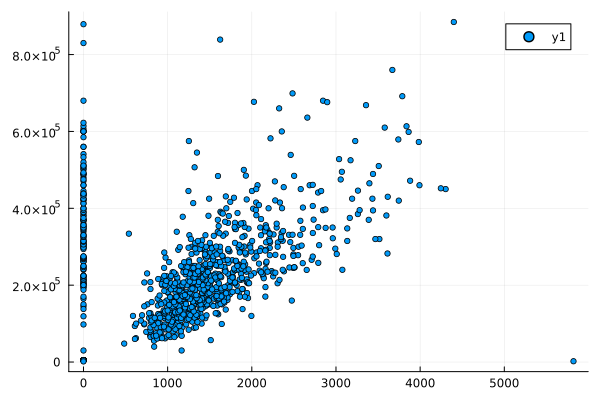

In [49]:
# Построение графика:
plot(size=(500,500),leg=false)
x = houses[!,:sq__ft]
y = houses[!,:price]
scatter(x,y,markersize=3)

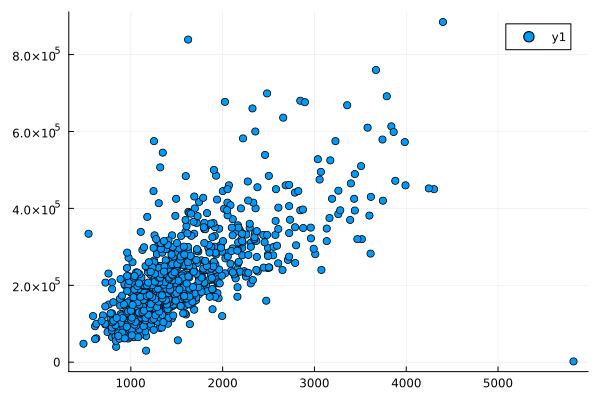

In [50]:
# Фильтрация данных по заданному условию:
filter_houses = houses[houses[!,:sq__ft].>0,:]
# Построение графика:
x = filter_houses[!,:sq__ft]
y = filter_houses[!,:price]
scatter(x,y)

In [55]:
#Определение средней цены для определённого типа домов:
by(filter_houses,:type,filter_houses->mean(filter_houses[!,:price]))

LoadError: UndefVarError: `by` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [54]:
import Pkg
Pkg.add("Clustering")
using Clustering

   Resolving package versions...
   Installed NearestNeighbors ─ v0.4.24
   Installed Clustering ─────── v0.15.8
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [aaaa29a8] + Clustering v0.15.8
    Updating `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
  [aaaa29a8] + Clustering v0.15.8
  [b8a86587] + NearestNeighbors v0.4.24
Precompiling project...
   6538.9 ms  ✓ NearestNeighbors
   5097.5 ms  ✓ Clustering
  2 dependencies successfully precompiled in 18 seconds. 607 already precompiled.


In [59]:
# Добавление данных :latitude и :longitude в новый фрейм:
X = filter_houses[!,[:latitude, :longitude]]
# Конвертация данных в матричный вид:
X = Matrix(X)

814×2 Matrix{Float64}:
 38.6319  -121.435
 38.4789  -121.431
 38.6183  -121.444
 38.6168  -121.439
 38.5195  -121.436
 38.6626  -121.328
 38.6817  -121.352
 38.5351  -121.481
 38.6212  -121.271
 38.7009  -121.443
 38.6377  -121.452
 38.4707  -121.459
 38.6187  -121.436
  ⋮       
 38.7035  -121.375
 38.7031  -121.235
 38.3898  -121.446
 38.8978  -121.325
 38.4679  -121.445
 38.4453  -121.442
 38.4174  -121.484
 38.4577  -121.36
 38.4999  -121.459
 38.7088  -121.257
 38.417   -121.397
 38.6552  -121.076

In [60]:
# Транспонирование матрицы с данными:
X = X'

2×814 adjoint(::Matrix{Float64}) with eltype Float64:
   38.6319    38.4789    38.6183  …    38.7088    38.417    38.6552
 -121.435   -121.431   -121.444      -121.257   -121.397  -121.076

In [61]:
# Задание количества кластеров:
k = length(unique(filter_houses[!,:zip]))

66

In [62]:
# Определение k-среднего:
C = kmeans(X,k)

KmeansResult{Matrix{Float64}, Float64, Int64}([38.6625965 38.48676566666667 … 38.415214 38.55230199999999; -121.31647775 -121.54238366666668 … -121.207899 -121.45057926666668], [4, 26, 39, 4, 11, 1, 55, 51, 49, 33  …  3, 6, 26, 20, 40, 47, 26, 34, 30, 7], [4.439077019924298e-5, 0.0005054545472376049, 0.00015412842913065106, 0.00015091797467903234, 0.00015539828018518165, 0.00012848789265262894, 5.823836545459926e-5, 0.00016118244093377143, 0.0011840738843602594, 0.00011686658399412408  …  5.784670793218538e-5, 5.2413251978578046e-5, 0.000216632652154658, 0.00023574619626742788, 0.00013415837747743353, 0.00016950622011790983, 0.0004134149457968306, 0.0006359726212394889, 0.0002555243445385713, 7.06132996128872e-5], [16, 6, 28, 21, 2, 3, 7, 4, 6, 5  …  19, 1, 15, 6, 15, 1, 22, 20, 3, 15], [16, 6, 28, 21, 2, 3, 7, 4, 6, 5  …  19, 1, 15, 6, 15, 1, 22, 20, 3, 15], 0.2041623775003245, 8, true)

In [63]:
# Формирование фрейма данных:
df = DataFrame(
    cluster = C.assignments,
    city = filter_houses[!,:city],
    latitude = filter_houses[!,:latitude],
    longitude = filter_houses[!,:longitude],
    zip = filter_houses[!,:zip])

Row,cluster,city,latitude,longitude,zip
,Int64,String15,Float64,Float64,Int64
1,4,SACRAMENTO,38.6319,-121.435,95838
2,26,SACRAMENTO,38.4789,-121.431,95823
3,39,SACRAMENTO,38.6183,-121.444,95815
4,4,SACRAMENTO,38.6168,-121.439,95815
5,11,SACRAMENTO,38.5195,-121.436,95824
6,1,SACRAMENTO,38.6626,-121.328,95841
7,55,SACRAMENTO,38.6817,-121.352,95842
8,51,SACRAMENTO,38.5351,-121.481,95820
9,49,RANCHO CORDOVA,38.6212,-121.271,95670


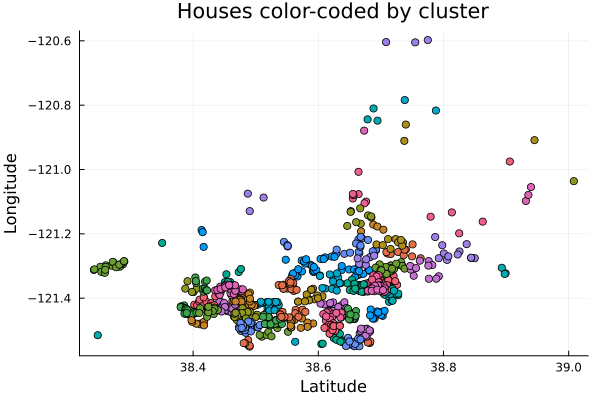

In [64]:
clusters_figure = plot(legend = false)
for i = 1:k
    clustered_houses = df[df[!,:cluster].== i,:]
    xvals = clustered_houses[!,:latitude]
    yvals = clustered_houses[!,:longitude]
    scatter!(clusters_figure,xvals,yvals,markersize=4)
end
xlabel!("Latitude")
ylabel!("Longitude")
title!("Houses color-coded by cluster")
display(clusters_figure)

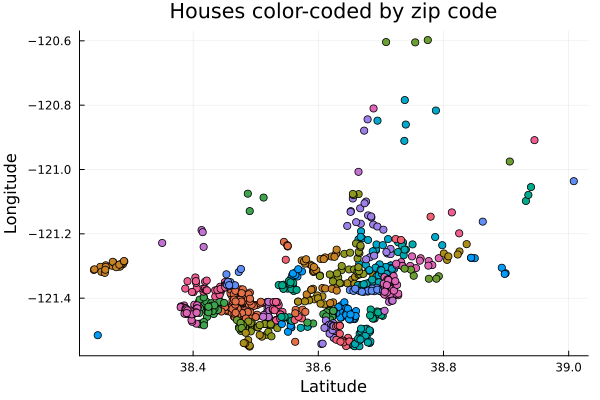

In [65]:
unique_zips = unique(filter_houses[!,:zip])
zips_figure = plot(legend = false)
for uzip in unique_zips
    subs = filter_houses[filter_houses[!,:zip].==uzip,:]
    x = subs[!,:latitude]
    y = subs[!,:longitude]
    scatter!(zips_figure,x,y)
end
xlabel!("Latitude")
ylabel!("Longitude")
title!("Houses color-coded by zip code")
display(zips_figure)

## Кластеризация данных. Метод k-ближайших соседей

In [66]:
import Pkg
Pkg.add("NearestNeighbors")
using NearestNeighbors

   Resolving package versions...
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [b8a86587] + NearestNeighbors v0.4.24
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`


In [67]:
knearest = 10
id = 70
point =X[:,id]

2-element Vector{Float64}:
   38.44004
 -121.421012

In [68]:
# Поиск ближайших соседей:
kdtree =KDTree(X)
idxs,dists = knn(kdtree, point, knearest, true)

([70, 764, 196, 125, 557, 368, 415, 92, 112, 683], [0.0, 0.006264891539364138, 0.00825320259050462, 0.008473585132630057, 0.009164073548370188, 0.009405065124697706, 0.009921759722950759, 0.009941028618812013, 0.010332637707777167, 0.011168993911721985])

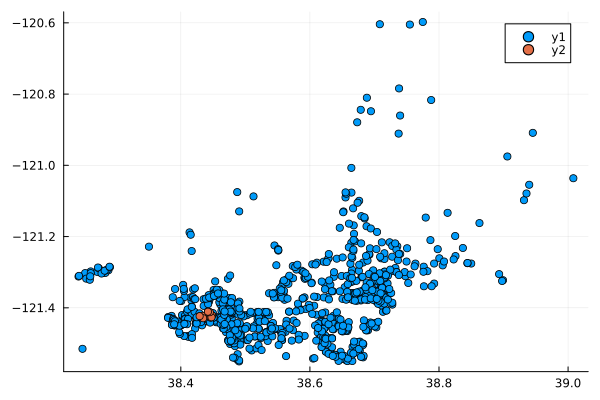

In [69]:
# Все объекты недвижимости:
x = filter_houses[!,:latitude];
y = filter_houses[!,:longitude];
scatter(x,y)
# Соседи:
x = filter_houses[idxs,:latitude];
y = filter_houses[idxs,:longitude];
scatter!(x,y)

In [70]:
#Фильтрация по районам соседних домов:
cities = filter_houses[idxs,:city]

10-element PooledArrays.PooledVector{String15, UInt32, Vector{UInt32}}:
 "SACRAMENTO"
 "ELK GROVE"
 "SACRAMENTO"
 "SACRAMENTO"
 "SACRAMENTO"
 "SACRAMENTO"
 "ELK GROVE"
 "ELK GROVE"
 "ELK GROVE"
 "ELK GROVE"

## Обработка данных. Метод главных компонент

In [88]:
# Фрейм с указанием площади и цены недвижимости:
F = filter_houses[!, [:sq__ft,:price]]
y = filter_houses[!, :price]
# Конвертация данных в массив:
F = Matrix(F)'
y = y'

1×814 adjoint(::Vector{Int64}) with eltype Int64:
 59222  68212  68880  69307  81900  89921  …  234000  235000  235301  235738

In [75]:
import Pkg
Pkg.add("MultivariateStats")
using MultivariateStats

   Resolving package versions...
   Installed Arpack_jll ──────── v3.5.1+1
   Installed Arpack ──────────── v0.5.4
   Installed MultivariateStats ─ v0.10.3
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [6f286f6a] + MultivariateStats v0.10.3
    Updating `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
  [7d9fca2a] + Arpack v0.5.4
  [6f286f6a] + MultivariateStats v0.10.3
⌅ [68821587] + Arpack_jll v3.5.1+1
        Info Packages marked with ⌅ have new versions available but compatibility constraints restrict them from upgrading. To see why use `status --outdated -m`
Precompiling project...
   2806.9 ms  ✓ Arpack_jll
   1538.4 ms  ✓ Arpack
   3788.4 ms  ✓ MultivariateStats
  3 dependencies successfully precompiled in 14 seconds. 609 already precompiled.


In [89]:
# Приведение типов данных к распределению для PCA:
M = fit(PCA, F)

PCA(indim = 2, outdim = 1, principalratio = 0.9999840784692097)

Pattern matrix (unstandardized loadings):
──────────────
           PC1
──────────────
1  460.52
2    1.19826e5
──────────────

Importance of components:
─────────────────────────────────────
                                  PC1
─────────────────────────────────────
SS Loadings (Eigenvalues)  1.43584e10
Variance explained         0.999984
Cumulative variance        0.999984
Proportion explained       1.0
Cumulative proportion      1.0
─────────────────────────────────────

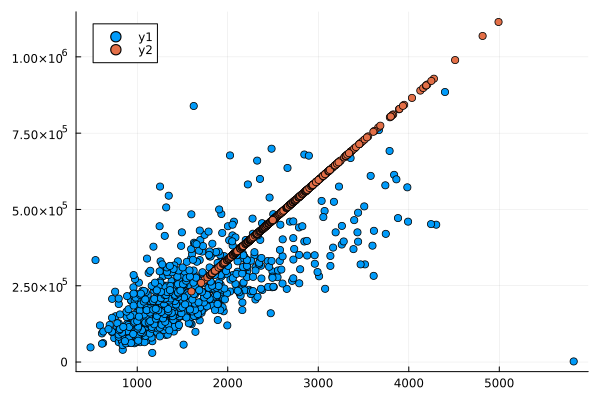

In [90]:
# Выделение значений главных компонент в отдельную переменную:
Xr = reconstruct(M, y)
# Построение графика с выделением главных компонент:
scatter(F[1,:],F[2,:])
scatter!(Xr[1,:],Xr[2,:])

##  Обработка данных. Линейная регрессия

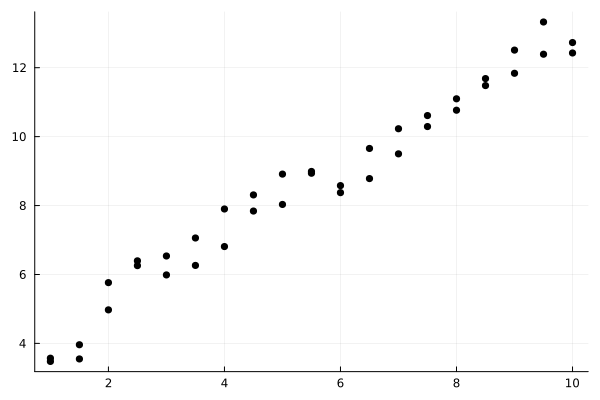

In [91]:
xvals = repeat(1:0.5:10,inner=2)
yvals = 3 .+ xvals + 2*rand(length(xvals)) .- 1
scatter(xvals,yvals,color=:black,leg=false)

In [92]:
function find_best_fit(xvals,yvals)
    meanx = mean(xvals)
    meany = mean(yvals)
    stdx = std(xvals)
    stdy = std(yvals)
    r = cor(xvals,yvals)
    a = r*stdy/stdx
    b = meany- a*meanx
    return a,b
end

find_best_fit (generic function with 1 method)

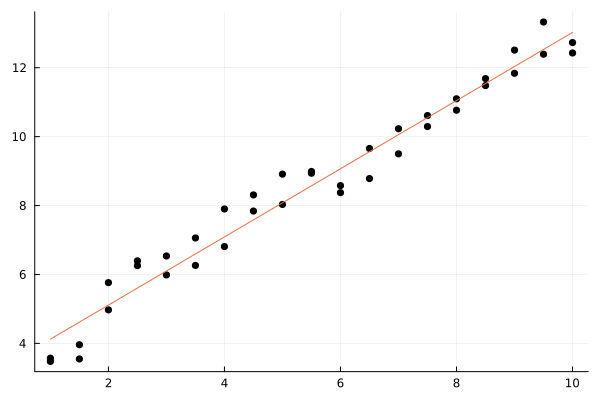

In [93]:
a,b = find_best_fit(xvals,yvals)
ynew = a * xvals .+ b
plot!(xvals,ynew)

In [98]:
xvals = 1:100000;
xvals = repeat(xvals,inner=3);
yvals = 3 .+ xvals + 2*rand(length(xvals)) .- 1;
@show size(xvals)
@show size(yvals)
@time a,b = find_best_fit(xvals,yvals)

size(xvals) = (300000,)
size(yvals) = (300000,)
  0.001933 seconds (5 allocations: 128 bytes)


(0.9999999666207922, 3.0020880560186924)

In [99]:
import Pkg
Pkg.add("PyCall")
Pkg.add("Conda")
using PyCall
using Conda

   Resolving package versions...
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`


In [104]:
ENV["PYTHON"] = "C:/Users/Home/AppData/Local/Programs/Python/Python310/python.exe"
using PyCall

py"""
import numpy
def find_best_fit_python(xvals, yvals):
    meanx = numpy.mean(xvals)
    meany = numpy.mean(yvals)
    stdx = numpy.std(xvals)
    stdy = numpy.std(yvals)
    r = numpy.corrcoef(xvals, yvals)[0][1]
    a = r * stdy / stdx
    b = meany - a * meanx
    return a, b
"""

xpy = PyObject(xvals)
ypy = PyObject(yvals)
@time a, b = py"find_best_fit_python"(xpy, ypy)

  0.161688 seconds (112.53 k allocations: 5.670 MiB, 89.54% compilation time)


(0.9999999666207929, 3.0020880560041405)

In [106]:
import Pkg
Pkg.add("BenchmarkTools")
using BenchmarkTools
@btime a,b = py"find_best_fit_python"(xvals,yvals)
@btime a,b = find_best_fit(xvals,yvals)

   Resolving package versions...
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  No Changes to `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`


  14.013 ms (32 allocations: 912 bytes)
  758.400 μs (1 allocation: 32 bytes)


(0.9999999666207922, 3.0020880560186924)

## Задания для самостоятельного выполнения

### Кластеризация

In [107]:
iris

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


In [117]:
k = 5
features = collect(Matrix(iris[:, 1:4])')
result = kmeans(features, k)

KmeansResult{Matrix{Float64}, Float64, Int64}([5.532142857142857 5.005999999999999 … 6.529166666666666 6.247222222222223; 2.6357142857142857 3.428000000000001 … 3.0583333333333336 2.847222222222222; 3.960714285714286 1.4620000000000002 … 5.508333333333333 4.775; 1.2285714285714289 0.2459999999999999 … 2.1624999999999996 1.5749999999999995], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2  …  4, 4, 5, 4, 4, 4, 5, 4, 4, 5], [0.019980000000018094, 0.20038000000000977, 0.17398000000001446, 0.2759800000000041, 0.03557999999999595, 0.45838000000000534, 0.17238000000000397, 0.004380000000011819, 0.6519799999999947, 0.1415800000000189  …  0.09572916666667197, 0.3248958333333576, 0.43293209876543415, 0.2657291666667163, 0.23822916666668448, 0.14656250000001592, 0.27959876543209816, 0.1257291666666731, 0.255729166666697, 0.3001543209876445], [28, 50, 12, 24, 36], [28, 50, 12, 24, 36], 46.472230158730966, 9, true)

In [111]:
features = collect(Matrix(iris[:, 1:4])')
result = kmeans(features, k)

KmeansResult{Matrix{Float64}, Float64, Int64}([5.901612903225807 6.8500000000000005 5.005999999999999; 2.748387096774194 3.073684210526315 3.428000000000001; 4.393548387096775 5.742105263157893 1.4620000000000002; 1.4338709677419357 2.0710526315789473 0.2459999999999999], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3  …  2, 2, 1, 2, 2, 2, 1, 2, 2, 1], [0.019980000000018094, 0.20038000000000977, 0.17398000000001446, 0.2759800000000041, 0.03557999999999595, 0.45838000000000534, 0.17238000000000397, 0.004380000000011819, 0.6519799999999947, 0.1415800000000189  …  0.15159279778393397, 0.4679085872576252, 0.7290166493236541, 0.09580332409976222, 0.2594875346260608, 0.3742243767313198, 0.8054682622268672, 0.4268559556786613, 0.6984349030471151, 0.6964360041623365], [62, 38, 50], [62, 38, 50], 78.851441426147, 5, true)

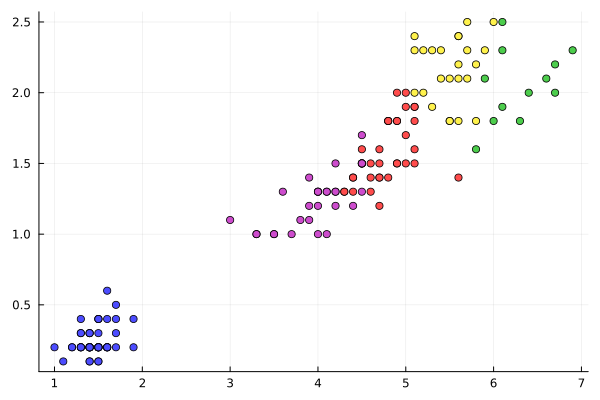

In [118]:
# plot with the point color mapped to the assigned cluster index
scatter(iris.PetalLength, iris.PetalWidth, marker_z=result.assignments,
        color=:lightrainbow, legend=false)

### Регрессия (метод наименьших квадратов в случае линейной регрессии)

#### Часть 1

In [119]:
X = randn(1000, 3)
a0 = rand(3)
y = X * a0 + 0.1 * randn(1000);

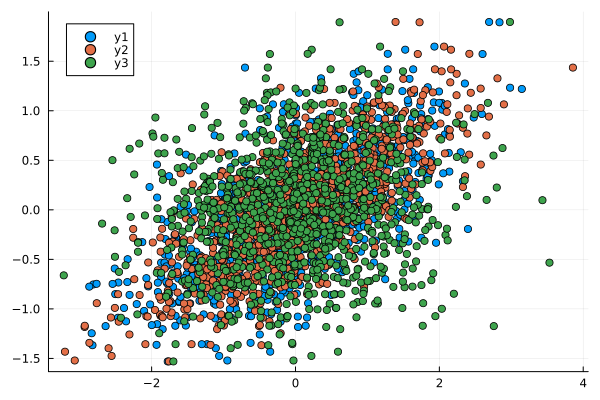

In [120]:
scatter(X, y)

In [128]:
X2 = hcat(ones(1000), X)

1000×4 Matrix{Float64}:
 1.0  -0.0604381  -0.625373    1.22276
 1.0  -1.27228     1.24969     1.03914
 1.0   0.354615    2.80779    -0.412585
 1.0  -0.719228   -0.526984    0.164481
 1.0   0.0708313   1.08811     0.676977
 1.0   1.52561     2.16184     0.225255
 1.0  -1.30472     0.47207     0.419778
 1.0   1.93639     0.190245    0.848004
 1.0   0.114126    0.0977352   0.488443
 1.0   0.4113     -0.175561    1.45981
 1.0   0.0713448   1.28034     1.00482
 1.0  -1.52461    -0.996172   -0.333673
 1.0   0.415664    1.71627     0.980183
 ⋮                            
 1.0  -1.03588     0.874489   -0.535439
 1.0  -0.82555    -0.10082     0.0292213
 1.0   1.21696    -0.300815    0.408862
 1.0  -0.313512    2.89735     0.380472
 1.0  -0.701871    3.85684    -0.384945
 1.0  -0.0867296  -1.24693    -0.36069
 1.0  -2.30697    -0.0157882   0.182975
 1.0   0.492604    0.647113   -1.15409
 1.0   0.457055   -0.142048   -1.45685
 1.0   0.681813    0.644967   -1.44354
 1.0  -1.17933    -0.0136517  -0

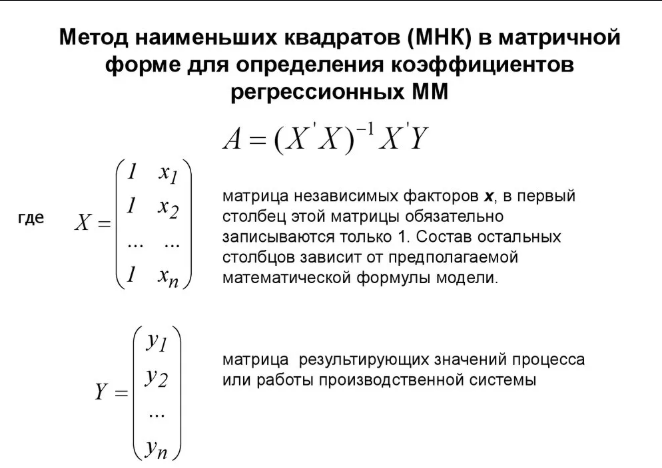

In [135]:
my_beta = inv(X2'X2)*(X2'y)

4-element Vector{Float64}:
 0.0011203350249490004
 0.3610800179894922
 0.42491389485302833
 0.05337234966985139

In [136]:
multi_beta = llsq(X, y)

4-element Vector{Float64}:
 0.3610800179894922
 0.4249138948530283
 0.0533723496698514
 0.0011203350249489991

In [138]:
import Pkg
Pkg.add("GLM")
using DataFrames, GLM

   Resolving package versions...
   Installed StatsModels ─── v0.7.7
   Installed ShiftedArrays ─ v2.0.0
   Installed GLM ─────────── v1.9.0
    Updating `C:\Users\Home\.julia\environments\v1.11\Project.toml`
  [38e38edf] + GLM v1.9.0
    Updating `C:\Users\Home\.julia\environments\v1.11\Manifest.toml`
  [38e38edf] + GLM v1.9.0
  [1277b4bf] + ShiftedArrays v2.0.0
  [3eaba693] + StatsModels v0.7.7
Precompiling project...
   5155.2 ms  ✓ ShiftedArrays
   7465.9 ms  ✓ StatsModels
   5668.7 ms  ✓ GLM
  3 dependencies successfully precompiled in 26 seconds. 612 already precompiled.


In [145]:
data = DataFrame(y=y, x1=X[:,1], x2=X[:,2], x3=X[:,3])
model = lm(@formula(y ~ x1 + x2 + x3), data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y ~ 1 + x1 + x2 + x3

Coefficients:
──────────────────────────────────────────────────────────────────────────────
                  Coef.  Std. Error       t  Pr(>|t|)    Lower 95%   Upper 95%
──────────────────────────────────────────────────────────────────────────────
(Intercept)  0.00112034  0.00313985    0.36    0.7213  -0.00504114  0.00728181
x1           0.36108     0.00308864  116.91    <1e-99   0.355019    0.367141
x2           0.424914    0.0031131   136.49    <1e-99   0.418805    0.431023
x3           0.0533723   0.00314545   16.97    <1e-56   0.0471999   0.0595448
──────────────────────────────────────────────────────────────────────────────

In [148]:
coef(model)

4-element Vector{Float64}:
 0.0011203350249489982
 0.3610800179894922
 0.4249138948530283
 0.0533723496698514

#### Часть 2

In [150]:
X = rand(100);
y = 2X + 0.1 * randn(100);
xvals = X
yvals = y

100-element Vector{Float64}:
  1.773324376451762
  0.630648690935898
  1.9038255143437033
  0.8297848222663882
  1.7041890995285516
  0.4284152707011613
  0.22359383575267613
  1.5402609868488666
  1.7272700239091416
  1.02096608704087
  0.5951617522777432
 -0.1190015247692795
  0.24065823367754305
  ⋮
  0.38470227731850687
  0.26216691775960316
  0.21564951479998565
  0.6037519506655664
  1.8448233894896453
  1.3652609470337322
  1.7244639393094792
 -0.002550149158618356
  0.10309328260380428
  2.06975501856286
  0.3328225800663359
  0.5340689821095412

In [151]:
function find_best_fit(xvals,yvals)
    meanx = mean(xvals)
    meany = mean(yvals)
    stdx = std(xvals)
    stdy = std(yvals)
    r = cor(xvals,yvals)
    a = r*stdy/stdx
    b = meany- a*meanx
    return a,b
end

find_best_fit (generic function with 1 method)

In [152]:
@time a,b = find_best_fit(xvals,yvals)

  0.019767 seconds (4.20 k allocations: 248.469 KiB, 99.31% compilation time)


(2.030013552566279, -0.006339733208682419)

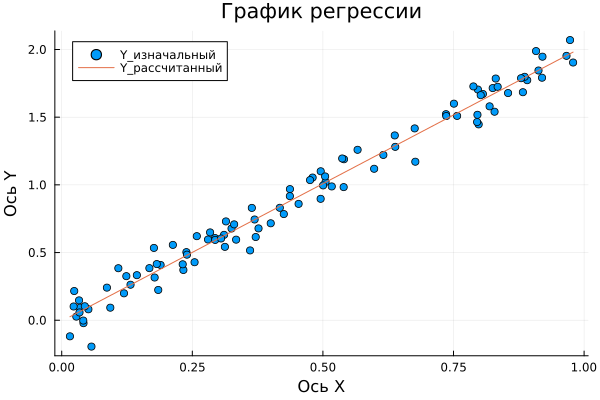

In [156]:
scatter(X, y, title="График регрессии", xlabel="Ось X", ylabel="Ось Y", label="Y_изначальный")
ynew = a * xvals .+ b
plot!(xvals, ynew, label="Y_рассчитанный")

### Модель ценообразования биномиальных опционов

In [178]:
S = 100
T = 1
n = 10000
sigma = 0.3
r = 0/08
h = T/n
u = exp(r*h + sigma*sqrt(h))
d = exp(r*h - sigma*sqrt(h))
p = (exp(r*h)-d)/(u-d)

0.49925000056249286

In [179]:
prices = []
price = S
push!(prices, price)

1-element Vector{Any}:
 100

In [180]:
for i in 1:n
    if rand() < p
        price *= u
    else 
        price *= d
    end
    push!(prices, price)
end

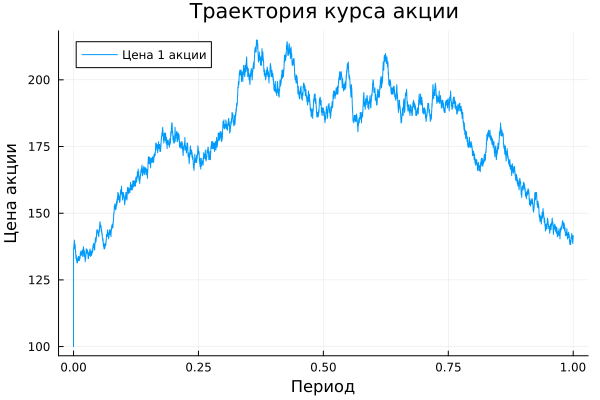

In [171]:
x = collect(0:h:1)
plot(x, prices, xlabel="Период", ylabel="Цена акции", 
    label="Цена 1 акции", title="Траектория курса акции")

In [181]:
function createPath(S::Float64, r::Float64, sigma::Float64, T::Float64, n::Float64)
    h = T/n 
    u = exp(r*h + sigma*sqrt(h))
    d = exp(r*h - sigma*sqrt(h))
    p = (exp(r*h)-d)/(u-d)
    prices = []
    price = S
    push!(prices, price)
    for i in 1:n
        if rand() < p
            price *= u
        else 
            price *= d
        end
        push!(prices, price)
    end
    x = collect(0:h:1)
    return(x, prices)
end

createPath (generic function with 1 method)

In [185]:
S = 100.
T = 1.
n = 10000.
sigma = 0.3
r = 0.08

0.08

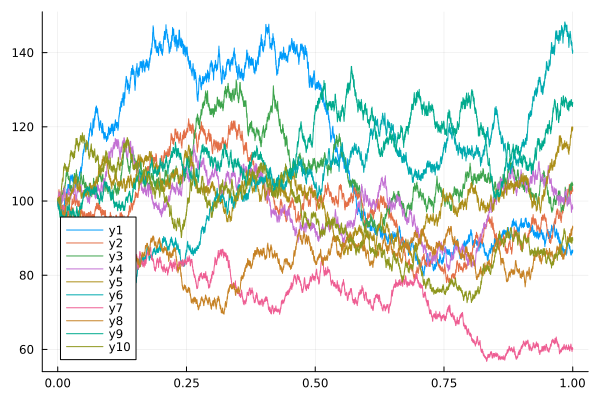

In [187]:
p = plot()
for i=1:10
   plot!(createPath(S, r, sigma, T, n))
end
p

In [188]:
function createPath_parallel(S::Float64, r::Float64, sigma::Float64, T::Float64, n::Float64)
    h = T/n 
    u = exp(r*h + sigma*sqrt(h))
    d = exp(r*h - sigma*sqrt(h))
    p = (exp(r*h)-d)/(u-d)
    prices = []
    price = S
    push!(prices, price)
    Threads.@threads for i in 1:n
        if rand() < p
            price *= u
        else 
            price *= d
        end
        push!(prices, price)
    end
    x = collect(0:h:1)
    return(x, prices)
end

createPath_parallel (generic function with 1 method)

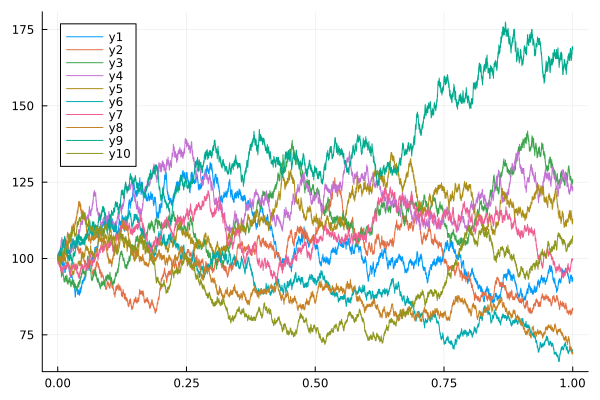

In [189]:
p = plot()
for i=1:10
   plot!(createPath_parallel(S, r, sigma, T, n))
end
p